In [26]:
!pip install mplcursors
!pip install ipympl
!pip install pyqt5
!pip install plotly
!pip install scikit-image

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import mplcursors
import plotly.express as px
import plotly.graph_objects as go

from skimage import io
import webbrowser
import os
import glob

In [28]:
# --- CONFIGURATION ---
# We assume this notebook is in the main folder, so data is just inside 'data/'
DATA_FOLDER = r'C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data'
WEAPON_FILE = r'C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data\weapon_stats.csv'
OUTPUT_FILE = r'C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\output\mirage_processed.csv'
TARGET_MAP = r'C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data\de_mirage.png'
CHUNK_SIZE = 100000 

# --- MAP MATH FOR MIRAGE ---
# These numbers align the game data to the map image
POS_X = -3230
POS_Y = 1713
SCALE = 5.0

def game_to_pixel(val, pos, scale):
    return (val - pos) / scale

print("Setup complete. Ready to process files.")

Setup complete. Ready to process files.


In [29]:
# Load the small integration dataset
try:
    weapons_df = pd.read_csv(WEAPON_FILE)
    print("Weapon stats loaded successfully!")
    display(weapons_df.head()) # Shows the first few rows nicely in Jupyter
except FileNotFoundError:
    print(f"ERROR: Could not find {WEAPON_FILE}. Please check your folder structure.")

Weapon stats loaded successfully!


,weapon,price,kill_reward,type
0,AK47,2700,300,Rifle
1,AK-47,2700,300,Rifle
2,M4A4,3100,300,Rifle
3,M4A1,3100,300,Rifle
4,M4A1-S,2900,300,Rifle


In [30]:
# Find all CSV files in the data folder
all_files = glob.glob(os.path.join(DATA_FOLDER, "*.csv"))

# Exclude the weapon_stats file from the game data list
all_files = [f for f in all_files if "weapon_stats.csv" not in f]
print(f"Found {len(all_files)} game data files to process.")

processed_chunks = []

# Loop through every file
for file_path in all_files:
    print(f"Processing file: {file_path}...")
    
    try:
        # Read the file in chunks (to handle the huge size)
        for chunk in pd.read_csv(file_path, chunksize=CHUNK_SIZE):
            
            # Filter 1: Keep only Mirage
            if 'map' in chunk.columns:
                df_filtered = chunk[chunk['map'] == TARGET_MAP].copy()
            else:
                continue 
            
            # Filter 2: Remove invalid damage (0 hp)
            if 'hp_dmg' in chunk.columns:
                df_filtered = df_filtered[df_filtered['hp_dmg'] > 0]
            
            # Transformation: Convert Game Coordinates to Pixels
            if 'att_pos_x' in df_filtered.columns and 'att_pos_y' in df_filtered.columns:
                df_filtered['pixel_x'] = df_filtered['att_pos_x'].apply(lambda x: game_to_pixel(x, POS_X, SCALE))
                df_filtered['pixel_y'] = df_filtered['att_pos_y'].apply(lambda y: game_to_pixel(y, POS_Y, SCALE))
            
            # Integration: Merge with weapon prices
            if 'wp' in df_filtered.columns:
                df_merged = pd.merge(df_filtered, weapons_df, left_on='wp', right_on='weapon', how='left')
                
                # Select only the columns we need for the visualization
                cols_to_keep = ['round', 'tick', 'att_side', 'vic_side', 'hp_dmg', 
                                'wp', 'pixel_x', 'pixel_y', 'price', 'type']
                
                # Only keep columns that actually exist after the merge
                valid_cols = [c for c in cols_to_keep if c in df_merged.columns]
                
                if not df_merged.empty:
                    processed_chunks.append(df_merged[valid_cols])
                    
    except Exception as e:
        print(f"Skipping {file_path} due to error: {e}")

# --- SAVE THE RESULT ---
if processed_chunks:
    print("Combining all chunks...")
    final_df = pd.concat(processed_chunks)
    
    # Create output folder if it doesn't exist
    os.makedirs('output', exist_ok=True)
    
    final_df.to_csv(OUTPUT_FILE, index=False)
    print(f"SUCCESS! Saved {len(final_df)} rows to {OUTPUT_FILE}")
    print("You can now proceed to visualization.")
else:
    print("WARNING: No data found for de_mirage. Check if your CSVs have data for this map.")

Found 11 game data files to process.
Processing file: C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data\esea_master_dmg_demos.part1.csv...


Processing file: C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data\esea_master_dmg_demos.part2.csv...
Processing file: C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data\esea_master_grenades_demos.part1.csv...
Processing file: C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data\esea_master_grenades_demos.part2.csv...
Processing file: C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data\esea_master_kills_demos.part1.csv...
Processing file: C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data\esea_master_kills_demos.part2.csv...
Processing file: C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data\esea_meta_demos.part1.csv...
Processing file: C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data\esea_meta_demos.part2.csv...
Processing file: C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data\map_data.csv...
Processing file: C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data\mm_grenades_demos.csv...
Processing file: C:\Users\Aditya Sing

In [31]:
# Load just the first 5 rows of the META file (Map info)
meta_df = pd.read_csv('data/esea_meta_demos.part1.csv', nrows=5)
print("--- META FILE COLUMNS ---")
print(meta_df.columns.tolist())
print(meta_df.head())

print("\n" + "="*30 + "\n")

# Load just the first 5 rows of the DAMAGE file (Shot info)
dmg_df = pd.read_csv('data/esea_master_dmg_demos.part1.csv', nrows=5)
print("--- DAMAGE FILE COLUMNS ---")
print(dmg_df.columns.tolist())
print(dmg_df.head())

--- META FILE COLUMNS ---
['file', 'map', 'round', 'start_seconds', 'end_seconds', 'winner_team', 'winner_side', 'round_type', 'ct_eq_val', 't_eq_val']
                      file          map  round  start_seconds  end_seconds  \
0  esea_match_13770997.dem  de_overpass      1       94.30782     160.9591   
1  esea_match_13770997.dem  de_overpass      2      160.95910     279.3998   
2  esea_match_13770997.dem  de_overpass      3      279.39980     341.0084   
3  esea_match_13770997.dem  de_overpass      4      341.00840     435.4259   
4  esea_match_13770997.dem  de_overpass      5      435.42590     484.2398   

        winner_team       winner_side    round_type  ct_eq_val  t_eq_val  
0  Hentai Hooligans         Terrorist  PISTOL_ROUND       4300      4250  
1  Hentai Hooligans         Terrorist           ECO       6300     19400  
2  Hentai Hooligans         Terrorist      SEMI_ECO       7650     19250  
3  Hentai Hooligans         Terrorist        NORMAL      24900     23400  
4   

In [32]:
# Load your weapon stats
weapons_df = pd.read_csv('data/weapon_stats.csv')
known_weapons = set(weapons_df['weapon'].unique())

# Load just a sample of the damage data (first 500k rows of one file is enough to check)
damage_files = glob.glob(os.path.join('data/', "esea_master_dmg_demos*.csv"))
sample_df = pd.read_csv(damage_files[0], nrows=500000)

# Get all unique weapon names appearing in the raw data
actual_weapons_in_game = set(sample_df['wp'].unique())

# Find the difference
missing_weapons = actual_weapons_in_game - known_weapons

print("--- MISSING WEAPONS ---")
print("The following names appear in the game data but are NOT in your CSV:")
for w in missing_weapons:
    print(f"- {w}")

print("\n(If this list is just 'NaN' or weird stuff like 'World', ignore it.")
print("If you see 'AK-47' or 'Grenade', add them to your CSV!)")

--- MISSING WEAPONS ---
The following names appear in the game data but are NOT in your CSV:

(If this list is just 'NaN' or weird stuff like 'World', ignore it.
If you see 'AK-47' or 'Grenade', add them to your CSV!)


In [33]:
# --- CONFIGURATION ---
DATA_FOLDER = 'data/'
TARGET_MAP = 'de_mirage'

# Find all META files (they contain the map names)
meta_files = glob.glob(os.path.join(DATA_FOLDER, "esea_meta_demos*.csv"))
print(f"Found {len(meta_files)} meta files.")

mirage_file_ids = set() # We use a 'set' because it is much faster for checking "is x in y"

# Loop through meta files to find Mirage matches
for meta_file in meta_files:
    print(f"Scanning {meta_file} for {TARGET_MAP} matches...")
    try:
        # Read the meta file
        df_meta = pd.read_csv(meta_file)
        
        # Filter for Mirage
        mirage_matches = df_meta[df_meta['map'] == TARGET_MAP]
        
        # Add these file IDs to our whitelist
        # We assume the column name is 'file' based on your output
        unique_ids = mirage_matches['file'].unique()
        mirage_file_ids.update(unique_ids)
        
    except Exception as e:
        print(f"Error reading {meta_file}: {e}")

print(f"\nSUCCESS: Found {len(mirage_file_ids)} unique matches played on {TARGET_MAP}.")
print("Example ID:", list(mirage_file_ids)[0] if mirage_file_ids else "None")

Found 2 meta files.
Scanning data\esea_meta_demos.part1.csv for de_mirage matches...
Scanning data\esea_meta_demos.part2.csv for de_mirage matches...

SUCCESS: Found 5279 unique matches played on de_mirage.
Example ID: esea_match_13788551.dem


In [34]:
# Find all CSV files in the data folder
all_files = glob.glob(os.path.join(DATA_FOLDER, "*.csv"))

# Exclude the weapon_stats file from the game data list
all_files = [f for f in all_files if "weapon_stats.csv" not in f]
print(f"Found {len(all_files)} game data files to process.")

processed_chunks = []

# Loop through every file
for file_path in all_files:
    print(f"Processing file: {file_path}...")
    
    try:
        # Read the file in chunks (to handle the huge size)
        for chunk in pd.read_csv(file_path, chunksize=CHUNK_SIZE):
            
            # Filter 1: Keep only Mirage
            if 'map' in chunk.columns:
                df_filtered = chunk[chunk['map'] == TARGET_MAP].copy()
            else:
                continue 
            
            # Filter 2: Remove invalid damage (0 hp)
            if 'hp_dmg' in chunk.columns:
                df_filtered = df_filtered[df_filtered['hp_dmg'] > 0]
            
            # Transformation: Convert Game Coordinates to Pixels
            if 'att_pos_x' in df_filtered.columns and 'att_pos_y' in df_filtered.columns:
                df_filtered['pixel_x'] = df_filtered['att_pos_x'].apply(lambda x: game_to_pixel(x, POS_X, SCALE))
                df_filtered['pixel_y'] = df_filtered['att_pos_y'].apply(lambda y: game_to_pixel(y, POS_Y, SCALE))
            
            # Integration: Merge with weapon prices
            if 'wp' in df_filtered.columns:
                df_merged = pd.merge(df_filtered, weapons_df, left_on='wp', right_on='weapon', how='left')
                
                # Select only the columns we need for the visualization
                cols_to_keep = ['round', 'tick', 'att_side', 'vic_side', 'hp_dmg', 
                                'wp', 'pixel_x', 'pixel_y', 'price', 'type']
                
                # Only keep columns that actually exist after the merge
                valid_cols = [c for c in cols_to_keep if c in df_merged.columns]
                
                if not df_merged.empty:
                    processed_chunks.append(df_merged[valid_cols])
                    
    except Exception as e:
        print(f"Skipping {file_path} due to error: {e}")

# --- SAVE THE RESULT ---
if processed_chunks:
    print("Combining all chunks...")
    final_df = pd.concat(processed_chunks)
    
    # Create output folder if it doesn't exist
    os.makedirs('output', exist_ok=True)
    
    final_df.to_csv(OUTPUT_FILE, index=False)
    print(f"SUCCESS! Saved {len(final_df)} rows to {OUTPUT_FILE}")
    print("You can now proceed to visualization.")
else:
    print("WARNING: No data found for de_mirage. Check if your CSVs have data for this map.")

Found 11 game data files to process.
Processing file: data\esea_master_dmg_demos.part1.csv...
Processing file: data\esea_master_dmg_demos.part2.csv...
Processing file: data\esea_master_grenades_demos.part1.csv...
Processing file: data\esea_master_grenades_demos.part2.csv...
Processing file: data\esea_master_kills_demos.part1.csv...
Processing file: data\esea_master_kills_demos.part2.csv...
Processing file: data\esea_meta_demos.part1.csv...
Processing file: data\esea_meta_demos.part2.csv...
Processing file: data\map_data.csv...
Processing file: data\mm_grenades_demos.csv...
Processing file: data\mm_master_demos.csv...
Combining all chunks...
SUCCESS! Saved 267433 rows to C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\output\mirage_processed.csv
You can now proceed to visualization.


Loaded 267433 rows for visualization.
Y-axis inverted. Now plotting...


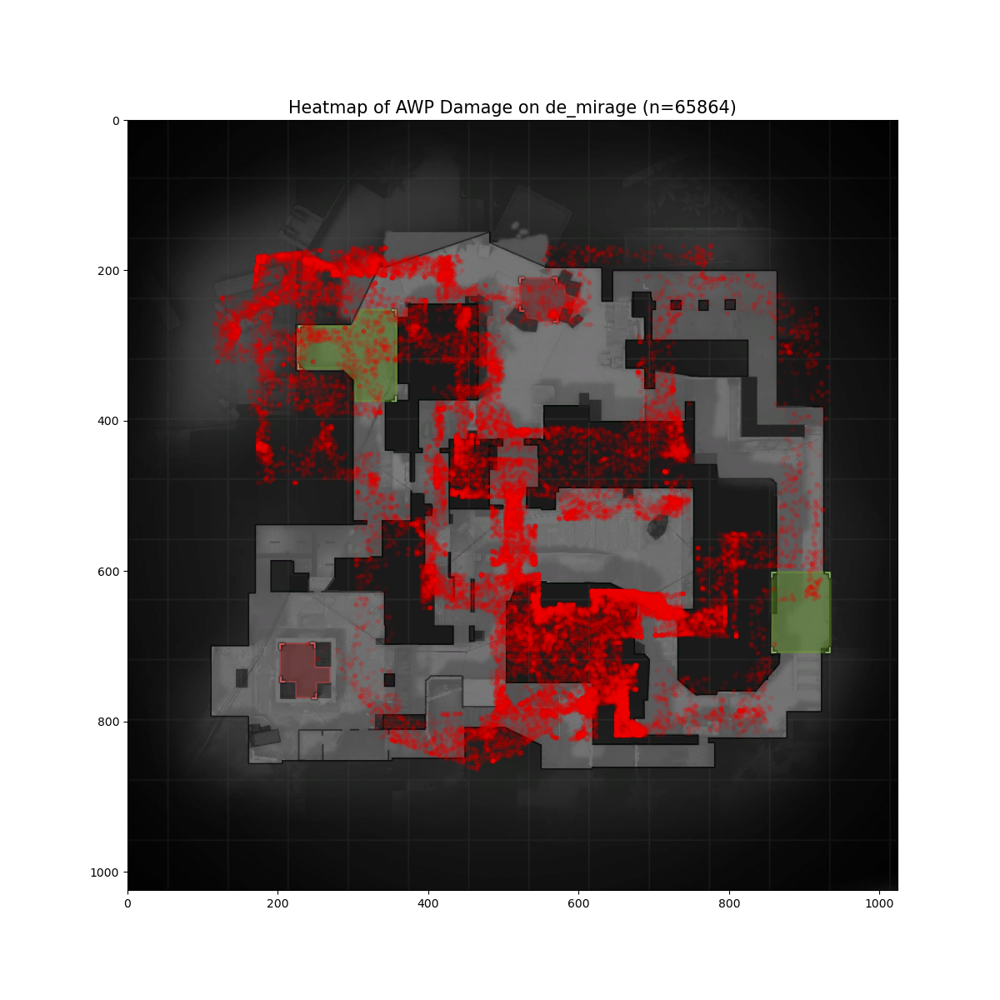

In [35]:
# --- CONFIGURATION ---
INPUT_FILE = r'C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\output\mirage_processed.csv'
MAP_IMAGE = r'C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data\de_mirage.png'

# Load the processed data
df = pd.read_csv(INPUT_FILE)
print(f"Loaded {len(df)} rows for visualization.")

# Load the map image
try:
    img = mpimg.imread(MAP_IMAGE)
except FileNotFoundError:
    print(f"ERROR: Could not find {MAP_IMAGE}. Make sure you downloaded it!")
    exit()

# FIX: Invert the Y-axis to match image coordinates
# We simply flip the sign because (Pos - GameY) is the inverse of (GameY - Pos)
df['pixel_y'] = df['pixel_y'] * -1

print("Y-axis inverted. Now plotting...")

# --- CREATE THE PLOT ---
fig, ax = plt.subplots(figsize=(12, 12))

# 1. Show the Map Background
# extent=[left, right, bottom, top] matches the pixel coordinates we calculated
# The map is usually 1024x1024. If your dots are off, we might need to tweak this.
ax.imshow(img, extent=[0, 1024, 0, 1024])

# 2. Plot the Data (The "Story")
# We filter for high-value kills (e.g., AWP or AK47) to make the map less cluttered
# You can change 'AWP' to 'AK-47' or remove the filter to see everything.
kills = df[df['wp'] == 'AK47']

# Plot the dots
# x=pixel_x, y=pixel_y
# alpha=0.1 makes them transparent (so stacking dots creates a "heat" effect)
ax.scatter(kills['pixel_x'], kills['pixel_y'], 
           c='red', s=10, alpha=0.05, label='AWP Damage')

# 3. Styling
ax.set_title(f"Heatmap of AWP Damage on de_mirage (n={len(kills)})", fontsize=15)
ax.set_xlim(0, 1024)
ax.set_ylim(1024, 0)
#ax.axis('off') # Hide the ugly numbers on the side

plt.show()

1. DATA CHECK:
Total rows loaded: 267433
Rows with weapon 'AWP': 10758

2. COORDINATE CHECK:
             pixel_x        pixel_y
count  267433.000000  267433.000000
mean      499.390016     522.068579
std       169.538626     200.992089
min       114.800200     165.003160
25%       399.926800     342.600000
50%       507.951140     541.110400
75%       630.342438     680.122200
max       937.166800     863.220800

3. BLIND PLOT CHECK:


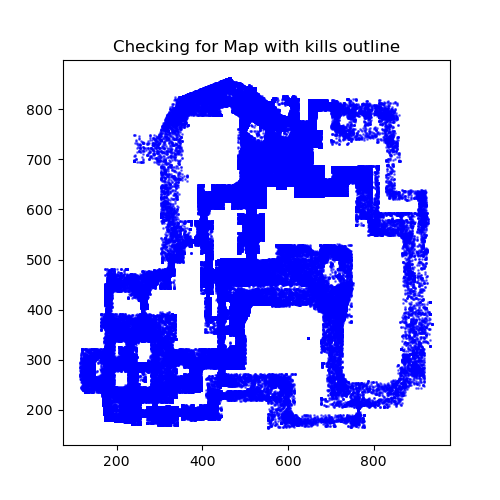

In [36]:
# --- DIAGNOSTIC CELL ---
print("1. DATA CHECK:")
print(f"Total rows loaded: {len(df)}")

# Check if the specific weapon filter found anything
awp_count = len(df[df['wp'] == 'AWP'])
print(f"Rows with weapon 'AWP': {awp_count}")

print("\n2. COORDINATE CHECK:")
# This tells us where the dots are actually trying to go
print(df[['pixel_x', 'pixel_y']].describe())

print("\n3. BLIND PLOT CHECK:")
# We plot WITHOUT the background image to see if the shape exists
plt.figure(figsize=(5, 5))
plt.scatter(df['pixel_x'], df['pixel_y'], s=1, c='blue', alpha=0.5)
plt.title("Checking for Map with kills outline")
plt.show()

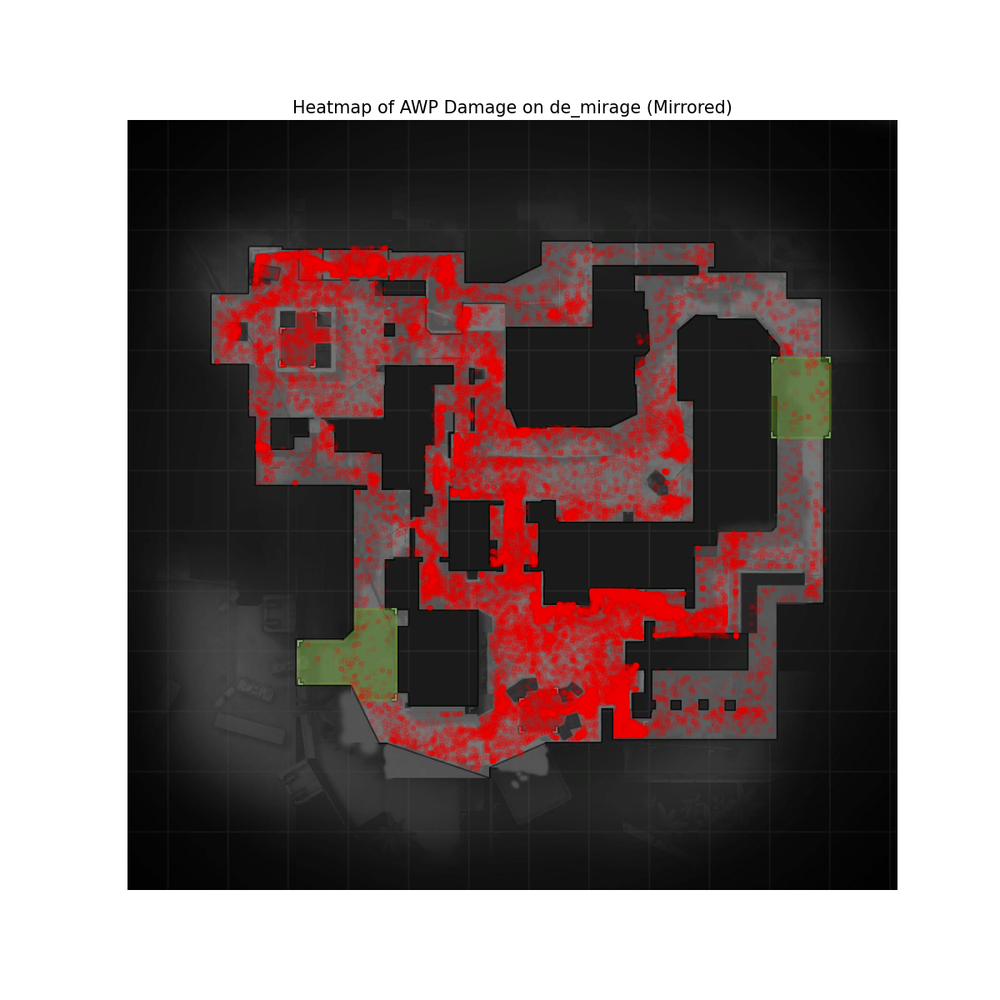

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

MAP_IMAGE = r"C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data\de_mirage1.png"

# --- CONFIGURATION ---
DOT_SIZE = 15      # Make dots bigger/smaller
DOT_OPACITY = 0.05 # Make dots clearer/fainter

# --- LOAD DATA ---
df = pd.read_csv(INPUT_FILE)
img = mpimg.imread(MAP_IMAGE)

# --- APPLY THE Y-AXIS FIX (We established this earlier) ---
# We flip the Y values so they match the image coordinate system
df['pixel_y'] = df['pixel_y'] * -1

# --- PLOT ---
fig, ax = plt.subplots(figsize=(12, 12))

# 1. Draw the Map
# 0, 1024 are the standard dimensions for radar images
ax.imshow(img, extent=[0, 1024, 0, 1024])

# 2. Draw the Dots (AWP Only for clarity)
# You can remove the [subset] filter to see ALL shots
subset = df[df['wp'] == 'AK47']
ax.scatter(subset['pixel_x'], subset['pixel_y'], 
           c='red', s=DOT_SIZE, alpha=DOT_OPACITY, label='AWP Damage')

# 3. THE MIRROR FIX
# We swap the limits: Start at 1024 (Right), End at 0 (Left)
ax.set_xlim(0, 1024)  
ax.set_ylim(1024, 0)

ax.set_title(f"Heatmap of AWP Damage on de_mirage (Mirrored)", fontsize=15)
ax.axis('off')

plt.show()

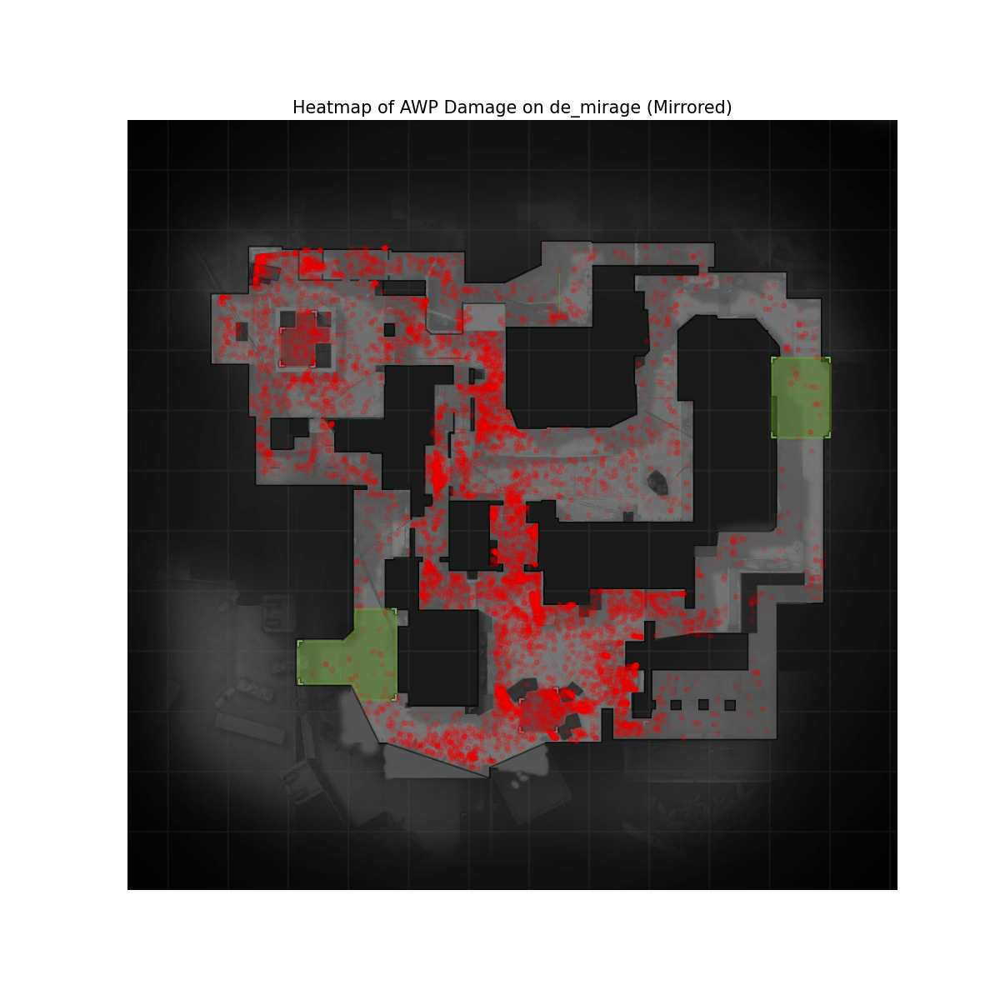

In [38]:
MAP_IMAGE = r"C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data\de_mirage1.png"

DOT_SIZE = 15 
DOT_OPACITY = 0.05

df = pd.read_csv(INPUT_FILE)
img = mpimg.imread(MAP_IMAGE)
df['pixel_y'] = df['pixel_y'] * -1

fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(img, extent=[0, 1024, 0, 1024])

subset = df[df['wp'] == 'M4A4']
ax.scatter(subset['pixel_x'], subset['pixel_y'], 
           c='red', s=DOT_SIZE, alpha=DOT_OPACITY, label='AWP Damage')

ax.set_xlim(0,1024)  
ax.set_ylim(1024, 0)

ax.set_title(f"Heatmap of AWP Damage on de_mirage (Mirrored)", fontsize=15)
ax.axis('off')

plt.show()

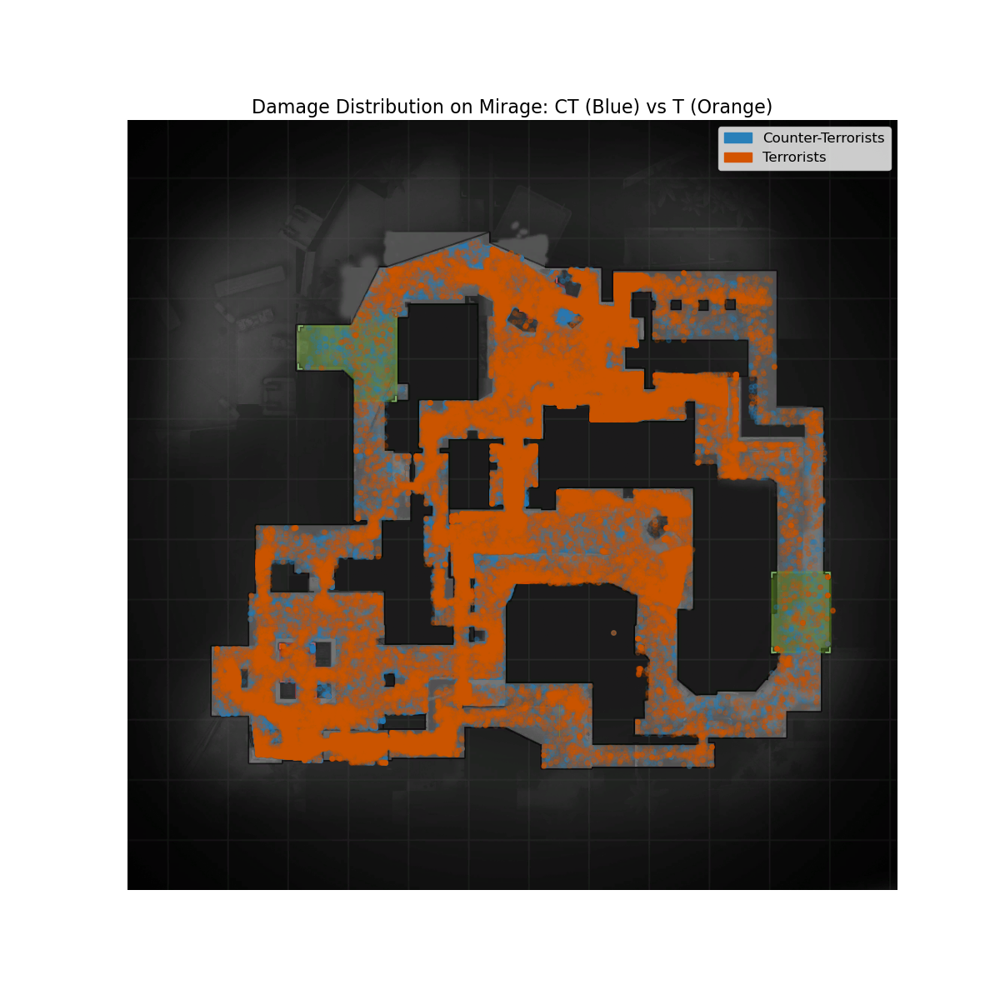

In [39]:
T_COLOR = "#d35400" 
CT_COLOR = "#2980b9" 

fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(img, extent=[0, 1024, 0, 1024])

ct_data = df[df['att_side'] == 'CounterTerrorist']
ax.scatter(ct_data['pixel_x'], ct_data['pixel_y'], 
           c=CT_COLOR, s=15, alpha=0.1, label='CT Damage')

t_data = df[df['att_side'] == 'Terrorist']
ax.scatter(t_data['pixel_x'], t_data['pixel_y'], 
           c=T_COLOR, s=15, alpha=0.1, label='T Damage')

ax.set_xlim(0, 1024)
ax.set_ylim(0, 1024)
ax.axis('off')
ax.set_title("Damage Distribution on Mirage: CT (Blue) vs T (Orange)", fontsize=16)

blue_patch = mpatches.Patch(color=CT_COLOR, label='Counter-Terrorists')
orange_patch = mpatches.Patch(color=T_COLOR, label='Terrorists')
plt.legend(handles=[blue_patch, orange_patch], loc='upper right', fontsize=12)

plt.show()

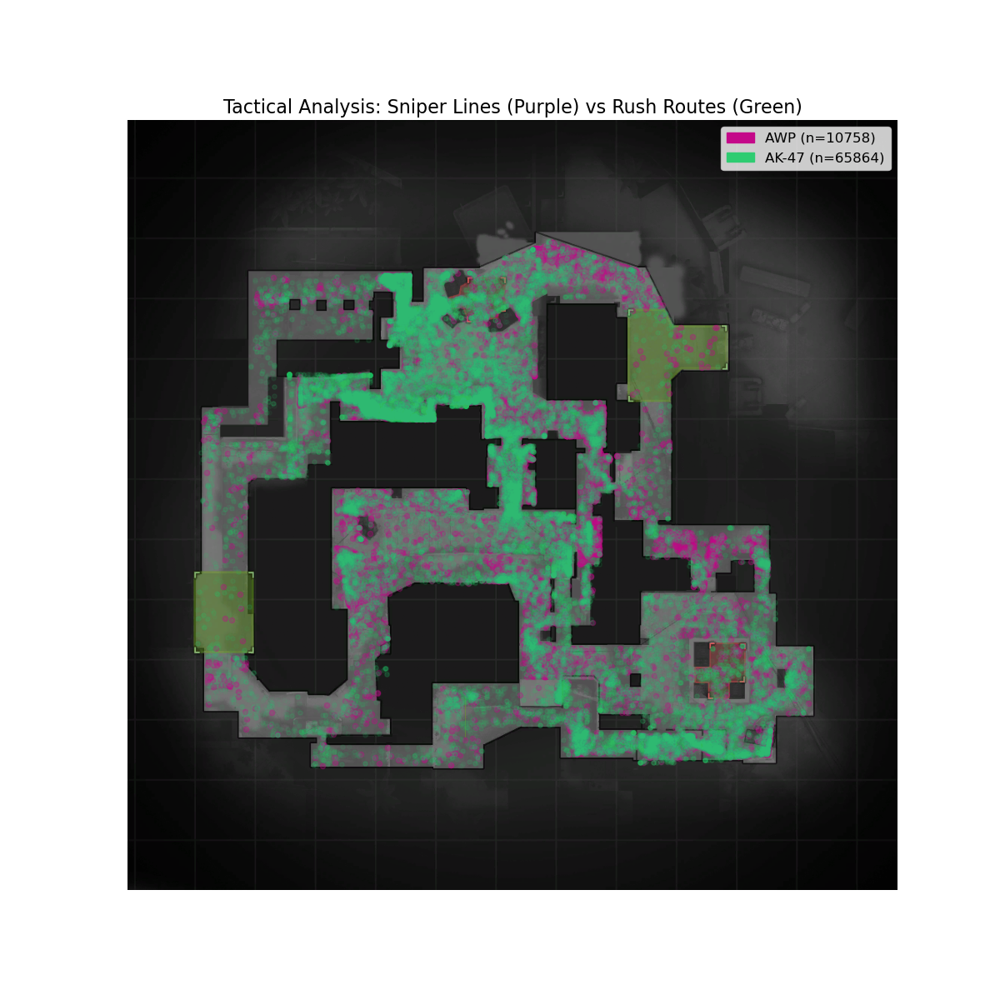

In [40]:
AWP_COLOR = "#C40889"
AK_COLOR  = '#2ecc71'

fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(img, extent=[0, 1024, 0, 1024])

awp_data = df[df['wp'] == 'AWP']
ax.scatter(awp_data['pixel_x'], awp_data['pixel_y'], 
           c=AWP_COLOR, s=20, alpha=0.3, label='AWP (Sniper)')

ak_data = df[df['wp'].isin(['AK47', 'AK-47'])]
ax.scatter(ak_data['pixel_x'], ak_data['pixel_y'], 
           c=AK_COLOR, s=15, alpha=0.05, label='AK-47 (Rifle)')

ax.set_xlim(1024, 0)
ax.set_ylim(0, 1024)
ax.axis('off')

ax.set_title("Tactical Analysis: Sniper Lines (Purple) vs Rush Routes (Green)", fontsize=16)

purple_patch = mpatches.Patch(color=AWP_COLOR, label=f'AWP (n={len(awp_data)})')
green_patch = mpatches.Patch(color=AK_COLOR, label=f'AK-47 (n={len(ak_data)})')
plt.legend(handles=[purple_patch, green_patch], loc='upper right', fontsize=12)

plt.show()

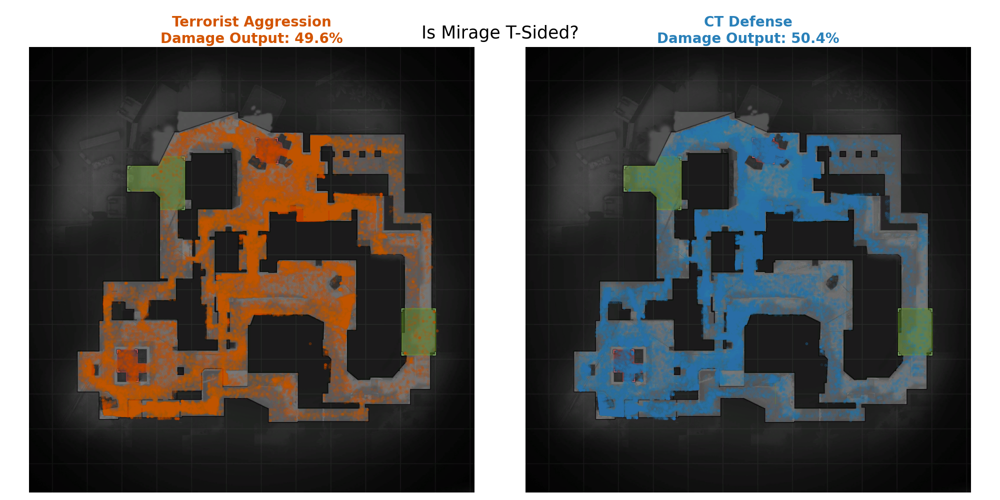

In [41]:
T_COLOR = '#d35400'   
CT_COLOR = '#2980b9'  

t_data = df[df['att_side'] == 'Terrorist']
ct_data = df[df['att_side'] == 'CounterTerrorist']

total_t_dmg = t_data['hp_dmg'].sum()
total_ct_dmg = ct_data['hp_dmg'].sum()
total_dmg = total_t_dmg + total_ct_dmg

t_percent = (total_t_dmg / total_dmg) * 100
ct_percent = (total_ct_dmg / total_dmg) * 100

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

ax1.imshow(img, extent=[0, 1024, 0, 1024])
ax1.scatter(t_data['pixel_x'], t_data['pixel_y'], 
            c=T_COLOR, s=10, alpha=0.05)
ax1.set_xlim(0, 1024)
ax1.set_ylim(0, 1024)
ax1.axis('off')
ax1.set_title(f"Terrorist Aggression\nDamage Output: {t_percent:.1f}%", 
              fontsize=20, color=T_COLOR, fontweight='bold')

ax2.imshow(img, extent=[0, 1024, 0, 1024])
ax2.scatter(ct_data['pixel_x'], ct_data['pixel_y'], 
            c=CT_COLOR, s=10, alpha=0.05)
ax2.set_xlim(0, 1024)
ax2.set_ylim(0, 1024)
ax2.axis('off')
ax2.set_title(f"CT Defense\nDamage Output: {ct_percent:.1f}%", 
              fontsize=20, color=CT_COLOR, fontweight='bold')

plt.suptitle("Is Mirage T-Sided?", fontsize=25, y=0.95)

plt.tight_layout()
plt.show()

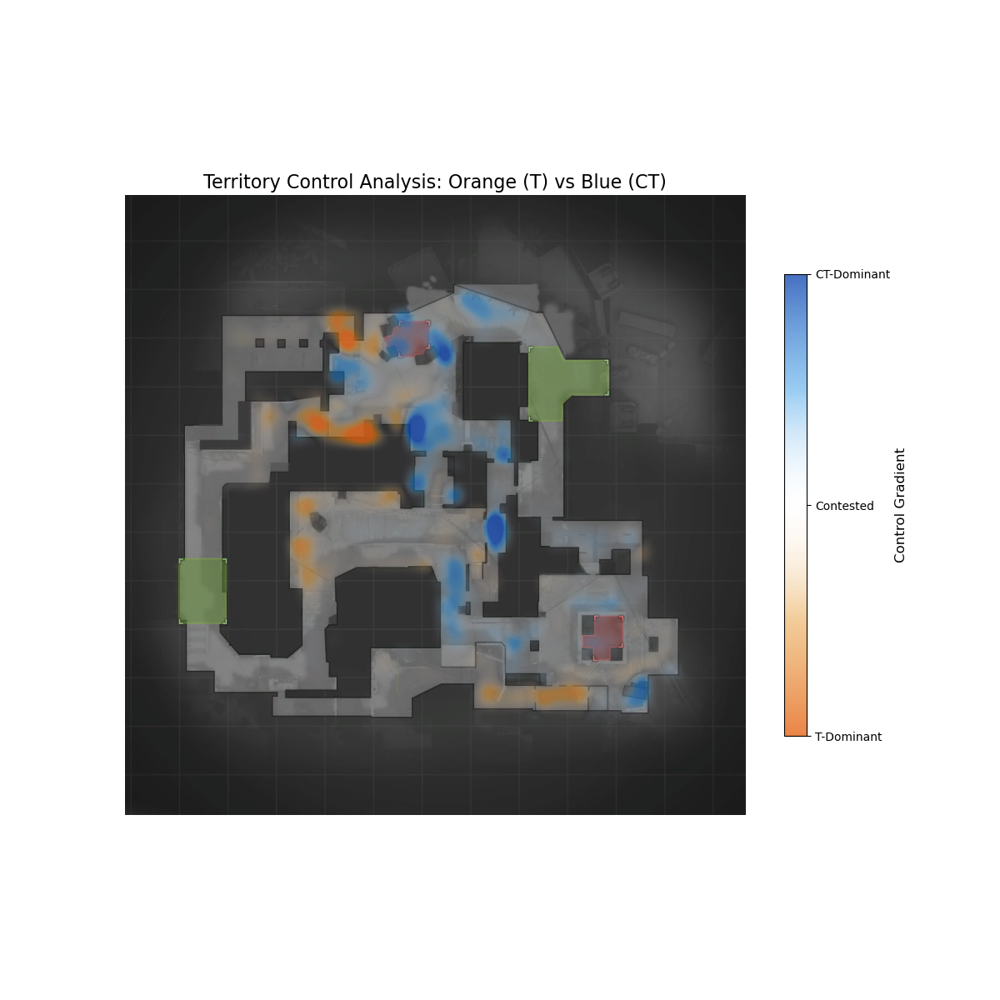

In [42]:
GRID_SIZE = 64 
SMOOTHING = 1.5 

x_bins = np.linspace(0, 1024, GRID_SIZE)
y_bins = np.linspace(0, 1024, GRID_SIZE)

t_data = df[df['att_side'] == 'Terrorist']
ct_data = df[df['att_side'] == 'CounterTerrorist']

heatmap_t, _, _ = np.histogram2d(t_data['pixel_x'], t_data['pixel_y'], bins=[x_bins, y_bins])
heatmap_ct, _, _ = np.histogram2d(ct_data['pixel_x'], ct_data['pixel_y'], bins=[x_bins, y_bins])

heatmap_t = heatmap_t.T
heatmap_ct = heatmap_ct.T

diff_map = heatmap_ct - heatmap_t

fig, ax = plt.subplots(figsize=(12, 12))

ax.imshow(img, extent=[0, 1024, 0, 1024])

colors = [(0.9, 0.4, 0.1, 0.8),
          (0.9, 0.6, 0.2, 0.5),
          (1.0, 1.0, 1.0, 0.1),
          (0.2, 0.6, 0.9, 0.5),
          (0.1, 0.3, 0.7, 0.8)]
cmap_diff = mcolors.LinearSegmentedColormap.from_list('DiffMap', colors)

max_val = np.max(np.abs(diff_map)) / 4

im = ax.imshow(diff_map, cmap=cmap_diff, interpolation='bicubic', 
               vmin=-max_val, vmax=max_val,
               extent=[0, 1024, 0, 1024], origin='lower')

ax.set_xlim(1024, 0)
ax.set_ylim(0, 1024)
ax.axis('off')
ax.set_title(f"Territory Control Analysis: Orange (T) vs Blue (CT)", fontsize=16)

cbar = plt.colorbar(im, ax=ax, shrink=0.6)
cbar.set_label('Control Gradient', fontsize=12)
cbar.set_ticks([-max_val, 0, max_val])
cbar.set_ticklabels(['T-Dominant', 'Contested', 'CT-Dominant'])

plt.show()

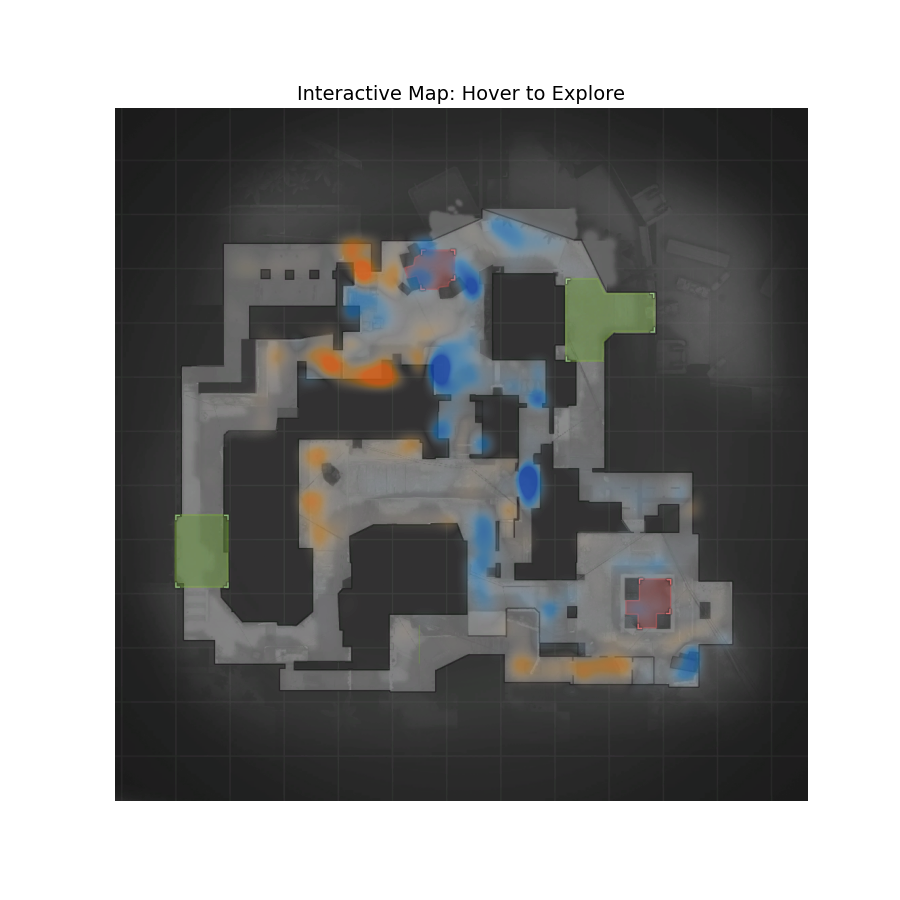

In [43]:
%matplotlib widget

FIG_SIZE = (9, 9) 

callouts = {
    "T Spawn": (1024 - 900, 80),
    "CT Spawn": (1024 - 120, 880),  
    "Palace": (1024 - 850, 650),    
    "A Site": (1024 - 620, 650),
    "B Site": (1024 - 280, 250),
    "Mid": (1024 - 550, 400),
    "Sniper's Nest": (1024 - 400, 550),
    "Connector": (1024 - 580, 580),
    "Jungle": (1024 - 600, 720),
    "Ticket": (1024 - 500, 850)
}

fig, ax = plt.subplots(figsize=FIG_SIZE)

fig.canvas.layout.width = '800px'
fig.canvas.layout.height = '800px'
fig.canvas.header_visible = False

ax.imshow(img, extent=[0, 1024, 0, 1024])
if 'diff_map' in locals():
    ax.imshow(diff_map, cmap=cmap_diff, interpolation='bicubic', 
              vmin=-max_val, vmax=max_val,
              extent=[0, 1024, 0, 1024], origin='lower')

x_coords = [pos[0] for pos in callouts.values()]
y_coords = [pos[1] for pos in callouts.values()]
labels = list(callouts.keys())

scat = ax.scatter(x_coords, y_coords, s=300, alpha=0, color='white')

ax.set_xlim(1024, 0)
ax.set_ylim(0, 1024)
ax.axis('off')
ax.set_title("Interactive Map: Hover to Explore", fontsize=14)

cursor = mplcursors.cursor(scat, hover=True)

@cursor.connect("add")
def on_add(sel):
    text_label = labels[sel.index]
    sel.annotation.set_text(text_label)
    sel.annotation.get_bbox_patch().set(fc="white", alpha=0.9, boxstyle="round,pad=0.5")

plt.show()

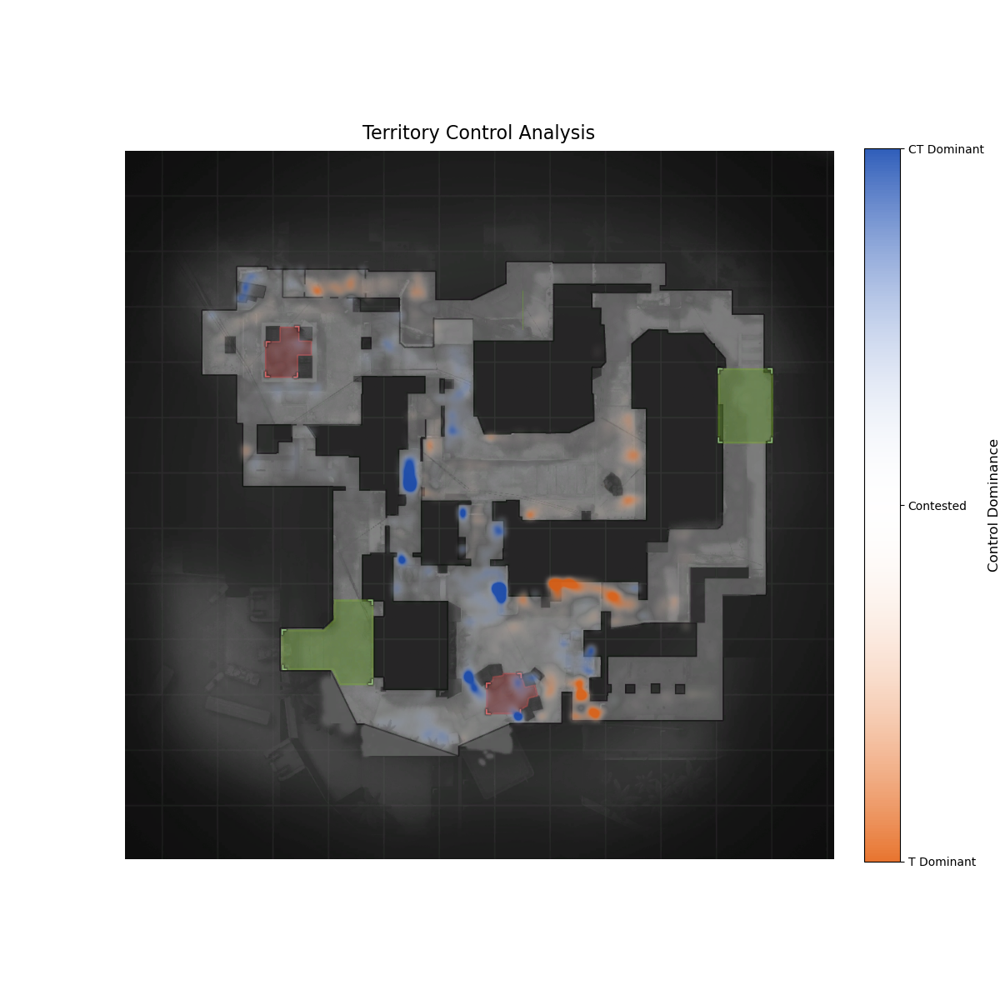

In [44]:

INPUT_CSV = r'C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\output\mirage_processed.csv'
BASE_MAP  = r'C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data\de_mirage1.png'

df = pd.read_csv(INPUT_CSV)
img = mpimg.imread(BASE_MAP)

t_data = df[df['att_side'] == 'Terrorist']
ct_data = df[df['att_side'] == 'CounterTerrorist']

GRID_SIZE = 128
x_bins = np.linspace(0, 1024, GRID_SIZE)
y_bins = np.linspace(0, 1024, GRID_SIZE)

if df['pixel_y'].mean() < 0:
    t_y = t_data['pixel_y'] * -1
    ct_y = ct_data['pixel_y'] * -1
else:
    t_y = t_data['pixel_y']
    ct_y = ct_data['pixel_y']

heatmap_t, _, _ = np.histogram2d(t_data['pixel_x'], t_y, bins=[x_bins, y_bins])
heatmap_ct, _, _ = np.histogram2d(ct_data['pixel_x'], ct_y, bins=[x_bins, y_bins])
diff_map = (heatmap_ct - heatmap_t).T

fig, ax = plt.subplots(figsize=(12, 12), dpi=100)

ax.imshow(img, extent=[0, 1024, 0, 1024])

colors = [(0.9, 0.4, 0.1, 0.9), (1.0, 1.0, 1.0, 0.05), (0.1, 0.3, 0.7, 0.9)]
cmap_diff = mcolors.LinearSegmentedColormap.from_list('DiffMap', colors)
max_val = np.max(np.abs(diff_map)) / 4

im = ax.imshow(diff_map, cmap=cmap_diff, interpolation='bicubic', 
               vmin=-max_val, vmax=max_val, extent=[0, 1024, 0, 1024], origin='lower')

ax.set_xlim(1024, 0) 
ax.set_ylim(0, 1024) 
ax.invert_xaxis()    
ax.invert_yaxis()    
ax.axis('off')       

plt.title("Territory Control Analysis", fontsize=16, pad=10)

cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Control Dominance', fontsize=12)
cbar.set_ticks([-max_val, 0, max_val])
cbar.set_ticklabels(['T Dominant', 'Contested', 'CT Dominant'])
cbar.ax.tick_params(labelsize=10)

plt.show()

In [45]:
IMAGE_PATH = r'C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\data\Heatmapped_Mirage_Crop.png'
OUTPUT_FILE = r'C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\output\Final_Circular_Map.html'

DEBUG_MODE = False

img = io.imread(IMAGE_PATH)

zones = [
    {"Label": "Top-Mid",   "x": 475, "y": 370, "Size": 70, "Desc": "<b>T-side Mid</b><br>Utility Heavy"},
    {"Label": "Window-Mid",  "x": 285, "y": 385, "Size": 45, "Desc": "<b>Window</b><br>CT Sniper's Point"},
    {"Label": "Mid",       "x": 390, "y": 375, "Size": 110, "Desc": "<b>MID</b><br>Heavily Contested."},
    {"Label": "Underpass",  "x": 308, "y": 350, "Size": 30, "Desc": "<b>Underpass</b><br>T Mid Sneak Entry"},
    {"Label": "Connector",  "x": 355, "y": 435, "Size": 45, "Desc": "<b>Connector</b><br>Mid to A Entry"},
    {"Label": "B short",  "x": 315, "y": 280, "Size": 45, "Desc": "<b>B Short</b><br>Mid to B Entry"},
    
    {"Label": "A Site",    "x": 385, "y": 545, "Size": 110, "Desc": "<b>A</b><br>Bomb Site A."},
    {"Label": "A Ramp",    "x": 475, "y": 490, "Size": 40, "Desc": "<b>Ramp</b><br>T Entry to A"},
    {"Label": "Jungle",    "x": 300, "y": 480, "Size": 50, "Desc": "<b>Jungle</b><br>CT Alt Entry to A"},
    {"Label": "CT Stairs",    "x": 310, "y": 600, "Size": 80, "Desc": "<b>CT-Stairs</b><br>CT Entry to A"},
    {"Label": "B Aps",    "x": 225, "y": 215, "Size": 40, "Desc": "<b>Apartments</b><br>T Entry to B"},
    {"Label": "B Site",    "x": 185, "y": 275, "Size": 110, "Desc": "<b>B</b><br>Bomb Site B."},
    {"Label": "Kitchen",    "x": 195, "y": 375, "Size": 50, "Desc": "<b>Kitchen</b><br>CT Entry to B"},
    
    {"Label": "CTSpawn",    "x": 210, "y": 535, "Size": 80,  "Desc": "<b>CT</b><br>CT-Spawn Area"},
    {"Label": "TSpawn",    "x": 585, "y": 324, "Size": 80,  "Desc": "<b>T</b><br>T-Spawn Area"},
    {"Label": "Palace",    "x": 505, "y": 570, "Size": 70,  "Desc": "<b>Palace</b><br>T Alt Entry to A"},
]


fig = px.imshow(img)
fig.add_trace(go.Scatter(
    x=[z['x'] for z in zones],
    y=[z['y'] for z in zones],
    mode='markers',
    marker=dict(
        size=[z['Size'] for z in zones],
        color='red' if DEBUG_MODE else 'white',
        opacity=0.4 if DEBUG_MODE else 0, # 0 = Invisible
    ),
    text=[z['Desc'] for z in zones],

    hovertemplate="<b>%{text}</b><extra></extra>",
    hoverinfo='text'
))

fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)

fig.update_layout(
    title="Final Interactive Map",
    margin=dict(l=0, r=0, t=30, b=0),
    width=1000, 
    height=1000,
    showlegend=False,
    hoverlabel=dict(bgcolor="white", font_size=16)
)

os.makedirs(os.path.dirname(OUTPUT_FILE), exist_ok=True)
fig.write_html(OUTPUT_FILE)
print(f"DONE! Opening Map: {OUTPUT_FILE}")
webbrowser.open('file://' + os.path.realpath(OUTPUT_FILE))

DONE! Opening Map: C:\Users\Aditya Singh\Desktop\Study\DMV\CSGO_Project\output\Final_Circular_Map.html


True